In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
!unzip "drive/MyDrive/Dog Vision/dog-breed-identification.zip" -d "drive/MyDrive/Dog Vision/"

Streaming output truncated to the last 5000 lines.
  inflating: drive/MyDrive/Dog Vision/train/83bc62b0fffa99a9c94ba0b67a5f7395.jpg  
  inflating: drive/MyDrive/Dog Vision/train/83bcff6b55ee179a7c123fa6103c377a.jpg  
  inflating: drive/MyDrive/Dog Vision/train/83be6d622ab74a5e7e08b53eb8fd566a.jpg  
  inflating: drive/MyDrive/Dog Vision/train/83c2d7419b0429b9fe953bc1b6cddbec.jpg  
  inflating: drive/MyDrive/Dog Vision/train/83cf7d7cd2a759a93e2ffd95bea9c6fb.jpg  
  inflating: drive/MyDrive/Dog Vision/train/83d405858f0931722ef21e8ac0adee4d.jpg  
  inflating: drive/MyDrive/Dog Vision/train/83d4125a4c3c7dc5956563276cb1cd74.jpg  
  inflating: drive/MyDrive/Dog Vision/train/83f0bb565b2186dbcc6a9d009cb26ff2.jpg  
  inflating: drive/MyDrive/Dog Vision/train/83fad0718581a696132c96c166472627.jpg  
  inflating: drive/MyDrive/Dog Vision/train/83fbbcc9a612e3f712b1ba199da61f20.jpg  
  inflating: drive/MyDrive/Dog Vision/train/8403d8936430c2f05ab7d74d23c2c0cb.jpg  
  inflating: drive/MyDrive/Dog Visio

### NOTES

1.  tf.constan() => its funcation that create constant tensor
2.   tf.data.Dataset.from_tensor_slices(tf.constant(X)) ==>
Creates a Dataset from the slices of the given tensor. Each element of the tensor becomes an individual element in the dataset.



*   dataset = {1,2,3,4,5,6,7,8,9}
-----> dataset.batch(3) :
array[1,2,3] , array[4,5,6] , array[7,8,9]





*  train_images, train_labels = next(train_data.as_numpy_iterator())==>

    train_data: This is assumed to be a TensorFlow Dataset object, likely representing a batch of training data.

    train_data.as_numpy_iterator(): This method creates a Python iterator that allows you to iterate over elements of the dataset and convert them to NumPy arrays.

    next(train_data.as_numpy_iterator()): This retrieves the next element (batch) from the iterator.

    train_images, train_labels = ...: This unpacks the elements of the retrieved batch into train_images and train_labels.

    next() is used here to iterate over the batches of training data, allowing you to efficiently process one batch at a time during the training of your machine learning model.










In [7]:
import tensorflow as tf
import tensorflow_hub as hub #GPU
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

### Getting our data ready (turning our images into tensors *numerical represention* )


In [8]:
labels_csv=pd.read_csv("drive/MyDrive/Dog Vision/labels.csv")

In [9]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


<Axes: >

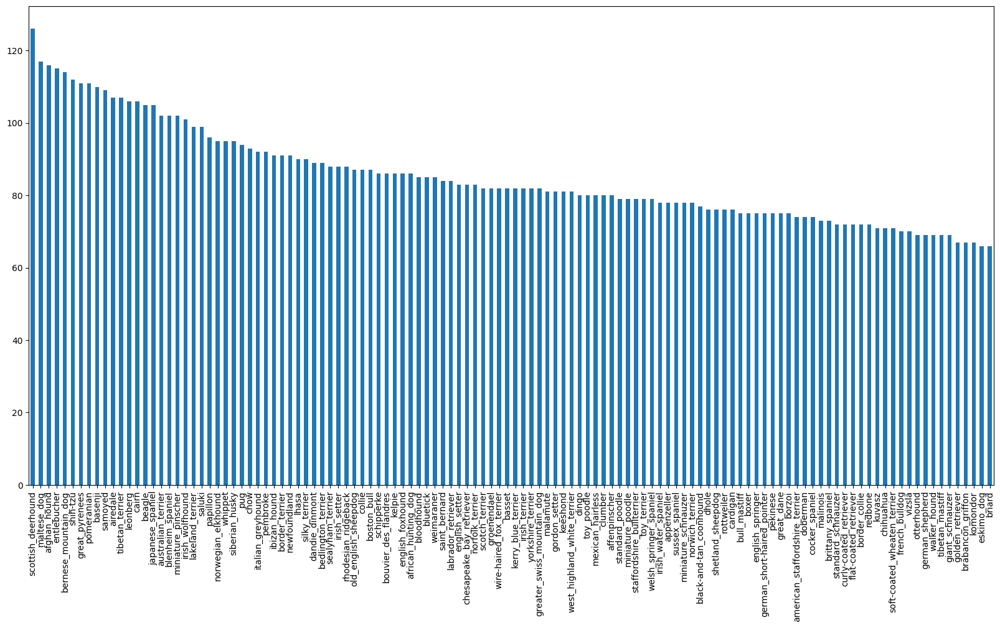

In [10]:
# check how many images for each bread:
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10))

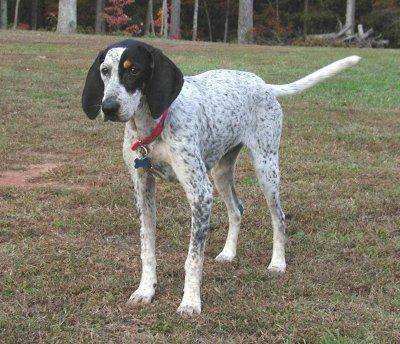

In [11]:
# view an image :
from IPython.display import Image
Image("drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg")

List of all image file path names

In [12]:
filenames=["drive/MyDrive/Dog Vision/train/" +fname for fname in labels_csv["id"] +".jpg"]
filenames

['drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg',
 'drive/MyDrive/Dog Vision/train/004396df1acd0f1247b740ca2b14616e.jpg',
 'drive/MyDrive/Dog Vision/train/0067dc3eab0b3c3ef0439477624d85d6.jpg',
 'drive/MyDrive/Dog Vision/train/00693b8bc2470375cc744a6391d397ec.jpg',
 'drive/MyDrive/Dog Vision/train/006cc3ddb9dc1bd827479569fcdc52d

In [13]:
# check if the number of filenames = number of actual image files
import os
if len(os.listdir("drive/MyDrive/Dog Vision/train/"))== len(filenames):
  print ("matches")
else:
  print("Not matched")


matches


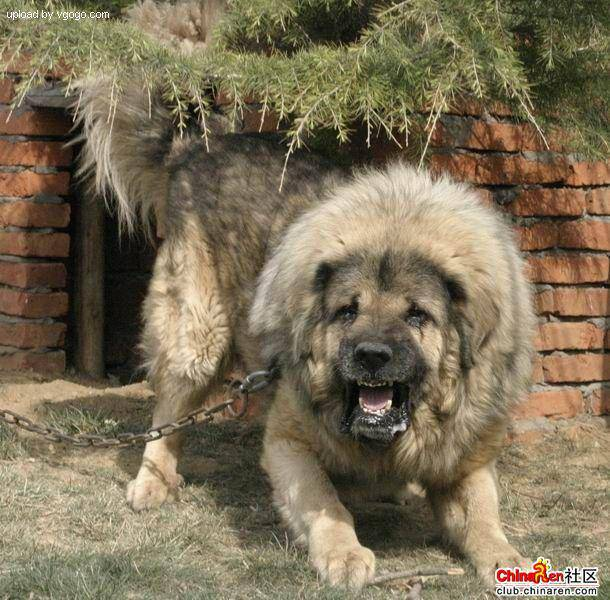

In [14]:
Image(filenames[9000])

Turning Data labels into **numbers**

In [15]:
labels =labels_csv["breed"].to_numpy()
len(labels)

10222

In [16]:
# find unique labels values

unique_breeds=np.unique(labels)
len(unique_breeds)

120

In [17]:
# turn every labels into boolean
boolean_labels=[label == unique_breeds for label in labels]
boolean_labels

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [18]:
len(boolean_labels)

10222

In [19]:
X = filenames
y = boolean_labels

In [20]:
NUM_IMAGES =1000 #@param {type:"slider", min:1000,max:10000,step:1000}

In [21]:
from sklearn.model_selection import train_test_split
X_train , X_val , y_train, y_val =train_test_split(X[:NUM_IMAGES],
                                                   y[:NUM_IMAGES],
                                                   test_size=0.2,
                                                   random_state=42)

In [22]:
len(X_train), len(X_val) , len(y_train), len(y_val)

(800, 200, 800, 200)

### **preprocessing images (turning images into tensors)**
To preprocess our images into Tensors we're going to write a function which does a few things:

1-Takes an image filename as input.

2-Uses TensorFlow to read the file and
save it to a variable, image.

3-Turn our image (a jpeg file) into Tensors with 3 colours (r,g,b)

4- normlize our image ( convert color channel values from 0-255 to 0-1)
because :
Compatibility with Activation Functions: Neural network activation functions, like the sigmoid or hyperbolic tangent (tanh), are often more effective when their inputs are in a certain range. Converting pixel values to the range of 0-1 makes them more compatible with these activation functions.

5-Resize the image to be of shape (224, 224) bec : Many pre-trained deep learning models, such as those available in popular frameworks like TensorFlow and PyTorch, are often trained on datasets with specific image sizes (e.g., 224x224 or 299x299). To use these pre-trained models, it's necessary to resize input images to the expected dimensions.

6-Return the modified image.

In [23]:
from matplotlib.pyplot import imread #image read
image = imread(filenames[2])
image.shape

(375, 500, 3)

In [24]:
IMG_SIZE=224

# takes image file path and change it into tensors

def process_image(image_path,img_size=IMG_SIZE):

  #1-Takes an image filename as input , 2-Uses TensorFlow to read the file and save it to a variable, image.
  image =tf.io.read_file(image_path)

  #3-Turn our image (a jpeg file) into Tensors with with 3 colours (r,g,b)
  image =tf.image.decode_jpeg(image,channels=3)

  #4-convert the colour channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)

  #5-Resize the image to be of shape (224, 224).
  image=tf.image.resize(image,size=[IMG_SIZE , IMG_SIZE])

  return image

### Turning our data into batches
why?

-if you are trying to process 10,000+ images in one go--> they all might not fit into memory

so thats why we do about 32 ( this is the batch size) images at a time ( you can adjust it manaully)

==> in order to use tensorflow effectively  we need our data in the form of tensor tuples which look like:

`(image , label)`

In [25]:
## create a func to return a tuple (image,label)

def get_iamge_label(image_path,label):
  image=process_image(image_path)
  return image , label

after made func that turn our date into tuples of tensors then we have to make another func that turn X & y into batches

In [26]:
BATCH_SIZE=32

# func turn data into batches

def create_data_batches(X,y=None,batch_size=BATCH_SIZE,valid_data=False , test_data=False):
  """
  creates batches of data out of image (X) and label (y) pairs
  shuffles the data if it is training data but doesnt shuffle if its validation data
  also accepts test data as input with no labels because the test data have no labels that
  i want my model to make predictions on unlabeled data (new data)
  """
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices(tf.constant(X)) # turn all of x into dataset
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    # data.map(process_image)=> transformation to apply the process_image function to each element in the dataset (data)
    #.batch(batchsize)=> tarnsform a group of consucutive elements into batches
    return data_batch

    # if the data is a valid dataset we don't need to shuffle it
    #bec the focus is on assessing the model's performance on fixed, unseen data.
  elif valid_data:
    print("Creating valiadtion data batches....")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y)))


    data_batch = data.map(get_iamge_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches.....")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y)))


    #Shuffling
    data =data.shuffle(buffer_size=len(X)) ## buffer_size=len(X) =>means shuffle all data in X

    # create (image , label) tuples
    data = data.map(get_iamge_label)

    # batches
    data_batch= data.batch(BATCH_SIZE)

    return data_batch

In [27]:
# Create a training and validation data batches

train_data= create_data_batches(X_train,y_train)
val_data= create_data_batches(X_val,y_val,valid_data=True)

Creating training data batches.....
Creating valiadtion data batches....


In [28]:
# check out the different attributes of our data batches
train_data.element_spec , val_data.element_spec
# element_spec ==> provides information about the type and shape of the elements in the dataset

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

### Visualizing Data Batches



In [29]:
# create a funcation for viewing images in data batch

def show_25_images(images , labels):
  """
  display a plot of 25 images and their labels
  """
  # setup the fig
  plt.figure(figsize=(10,10))
  #loop through 25
  for i in range(25):
    # create subplots (5 rows , 5 columns)
    ax=plt.subplot(5,5,i+1) # (rows, columns , index)
    #display an image
    plt.imshow(images[i])
    #add the image label as title
    plt.title(unique_breeds[labels[i]])

    # remove the numbers on x-axis & y-axis
    plt.axis("off")


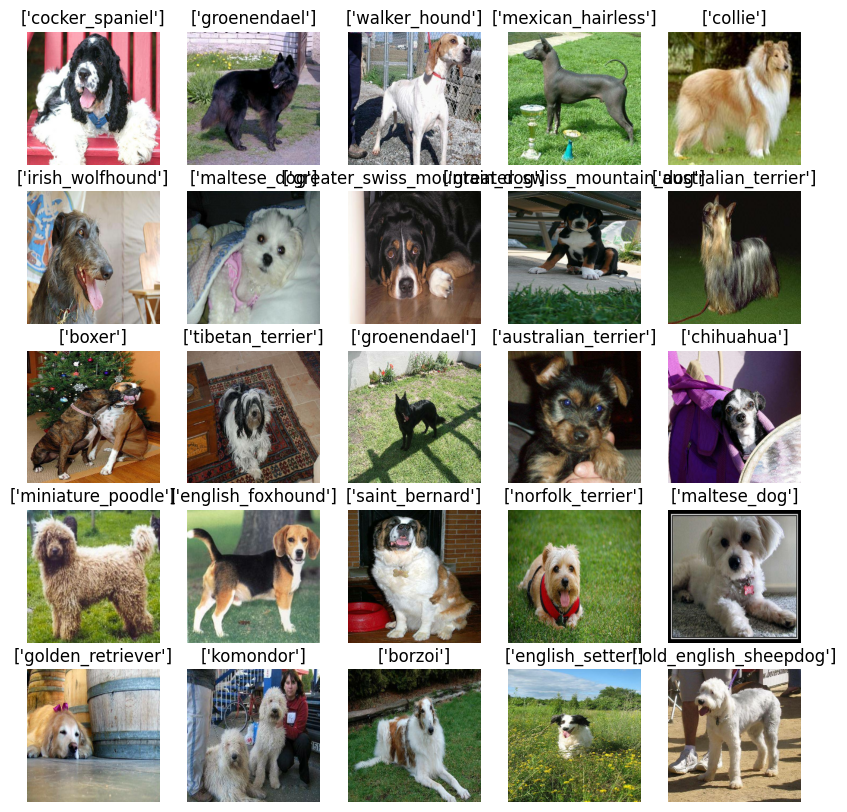

In [30]:
## visulaize our training set
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images,train_labels)

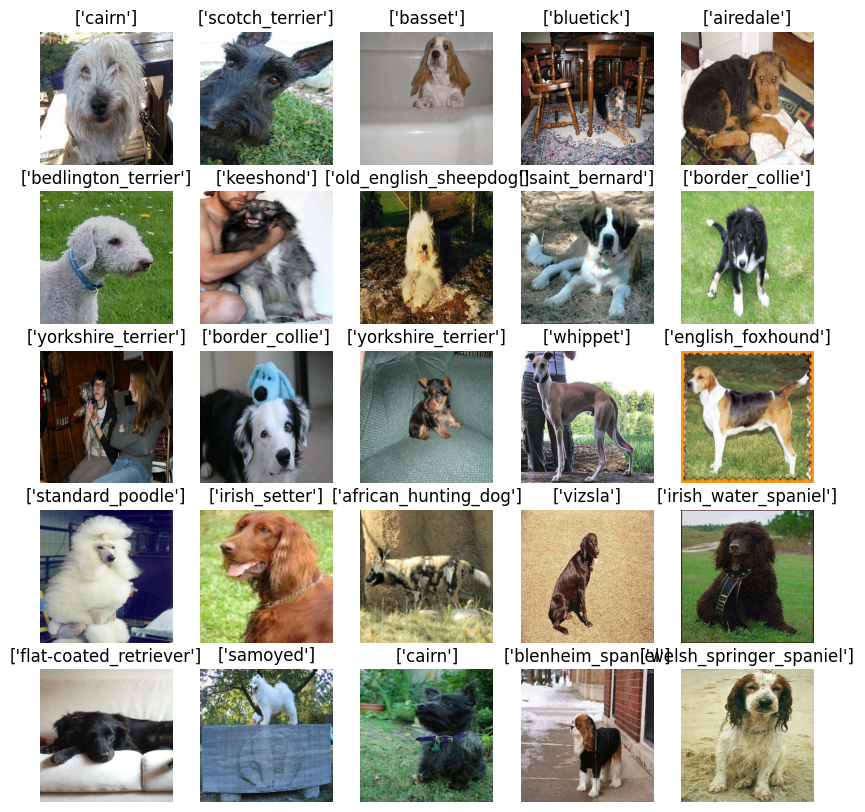

In [31]:
# visualize our validation set
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images,val_labels)

### Building a model



*   the input shape (our image shape in form of tensors) to our model
*   the output shape (image labels in form of tensors) of our model
* The URL of the model we want to use





In [32]:
# setup input shape to the model

INPUT_SHAPE =[None , IMG_SIZE ,IMG_SIZE ,3] # [batch= none bec it flexible , height , width , colour channels = RGB]

# setup the output shape of our model

OUTPUT_SHAPE =len(unique_breeds)

# setup model URL from Tensorflow HUb

MODEL_URL=  "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

###let's create a function which:

Takes the input shape, output shape and the model we've chosen's URL as parameters.

Defines the layers in a Keras model in a sequential fashion (do this first, then this, then that).

Compiles the model (says how it should be evaluated and improved).

Builds the model (tells it what kind of input shape it'll be getting).

Returns the model.

In [33]:
# creates the funcation to build a keras model

def create_model(input_shape=INPUT_SHAPE , output_shape=OUTPUT_SHAPE , model_url = MODEL_URL):
  print("Building model with :", MODEL_URL)

  #setup the model layers

  model = tf.keras.Sequential([
      hub.KerasLayer(MODEL_URL), # layer 1 (input layer)
      tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                            activation="softmax") # layer 2 (output layer)
  ])

  #compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  # build model

  model.build(INPUT_SHAPE)

  return model

keras Sequential API:

Definition: The Sequential API is a linear stack of layers where you can simply add one layer at a time. It is a straightforward way to create a neural network by adding one layer at a time, in a sequential fashion.

Use cases: Sequential API is suitable for simple models where the data flows sequentially through the layers, such as feedforward neural networks.

Advantages:

Simplicity: It is easy to use and understand, making it suitable for beginners.

Straightforward: It's a linear, intuitive way of building models.



keras functional API:

Definition: The Functional API allows for more complex model architectures, including multiple input and output connections, shared layers, and non-sequential data flows. It involves explicitly connecting the output of one layer to the input of another.

Use cases: Functional API is more flexible and suitable for complex models with multiple inputs or outputs, shared layers, and non-sequential connections, such as multi-input neural networks or models with shared layers.

Advantages:

Flexibility: It allows for the creation of complex architectures.

Multiple inputs/outputs: Supports models with multiple inputs and outputs.

Shared layers: Layers can be reused and shared between different parts of the model.



###Explain the prev func:

cause we use mobilenet V2 model so we will have 2 layers

if we work with binary classification use:
activation : sigmoid

loss Binary Crossentropy

if we work with multi class classification use:
activation : Softmax

loss : Categorical Crossentropy


` since that we have 120 unique labels (targets) so we work on multiclass classification `

`if we have two labels (0,1) or (yes , no) so we work with binary class classification`


`optimizer=tf.keras.optimizers.Adam()
==> general optimizer that minimize the loss funcation
why adam? because: known for its adaptive learning rate and efficient convergence properties`





In [34]:
model = create_model()
model.summary()

Building model with : https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


### To train our model we need callbacks



###Creating callbacks
We've got a model ready to go but before we train it we'll make some callbacks.

Callbacks are helper functions a model can use during training to do things such as save a models progress, check a models progress or stop training early if a model stops improving.

The two callbacks we're going to add are a TensorBoard callback which helps to track our model progress.

and an Early Stopping callback which prevents our model from training too long

### Tensorboard call back

To set up a TensorBoard callback and view TensorBoard in a notebook, we need to do three things:

1-Load the TensorBoard notebook extension.

2-Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's fit() function.

3-Visualize the our models training logs using the %tensorboard magic function




In [35]:
# load tensor board notebook extension
%load_ext tensorboard


In [36]:
import datetime

# create a func to build a tensorboard callback

def create_tensorboard_callback():
  # create a log directory for storing tesnorboard logs
  logdir = os.path.join("drive/MyDrive/Dog Vision/logs",
                        #make logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

### Early Stopping Callback
Early stopping helps prevent overfitting by stopping a model when a certain evaluation metric stops improving. If a model trains for too long, it can do so well at finding patterns in a certain dataset that it's not able to use those patterns on another dataset it hasn't seen before (doesn't generalize).

It's basically like saying to our model, "keep finding patterns until the quality of those patterns starts to go down."

In [37]:
# create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

monitor="val_accuracy" in the EarlyStopping callback, it's like telling the training process, "Keep an eye on how well the model is doing on the validation data. If the accuracy on that data stops improving for a certain number of consecutive training epochs (given by the patience parameter), let's stop the training early to save time

The higher the validation accuracy, the better your model is at making correct predictions on new data.

Patience = 3 means: "I will be patient seeing no improvement in validation accuracy for up to 3 consecutive epochs (rounds)."
So, during training, if your model's validation accuracy doesn't get better for three epochs in a row, the EarlyStopping callback will say, "Okay, I've been patient, and I haven't seen improvement for three rounds. Let's stop training now to avoid spending more time without making progress."

### Now we able to training our model

we will training on subset of data to check if everything is working then we will train on full data set later...

In [38]:
# How many rounds should we get the model to look through the data?
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

In [39]:
# lets create a func which trained a model

#Create a model using create_model().
#Setup a TensorBoard callback using create_tensorboard_callback() (we do this here so it creates a log directory of the current date and time).
#Call the fit() function on our model passing it the training data, validatation data, number of epochs to train for and the callbacks we'd like to use.
#Return the fitted model.

def train_model():
  model = create_model()
  tensorboard=create_tensorboard_callback()

  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,# check validation metrics every epoch
            callbacks=[tensorboard , early_stopping])
  return model

In [45]:
model=train_model() # train images= 800 divide 32 no.of batches = 25

Building model with : https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
25/25 [==============================] - 52s 2s/step - loss: 4.5547 - accuracy: 0.1037 - val_loss: 3.3546 - val_accuracy: 0.2700
Epoch 2/100
25/25 [==============================] - 37s 1s/step - loss: 1.5941 - accuracy: 0.7013 - val_loss: 2.1179 - val_accuracy: 0.5400
Epoch 3/100
25/25 [==============================] - 36s 1s/step - loss: 0.5466 - accuracy: 0.9463 - val_loss: 1.7037 - val_accuracy: 0.6200
Epoch 4/100
25/25 [==============================] - 37s 2s/step - loss: 0.2506 - accuracy: 0.9912 - val_loss: 1.5301 - val_accuracy: 0.6250
Epoch 5/100
25/25 [==============================] - 44s 2s/step - loss: 0.1443 - accuracy: 0.9987 - val_loss: 1.4564 - val_accuracy: 0.6350
Epoch 6/100
25/25 [==============================] - 37s 2s/step - loss: 0.0999 - accuracy: 0.9975 - val_loss: 1.4182 - val_accuracy: 0.6350
Epoch 7/100
25/25 [==============================] - 38s 2s/

In [41]:
# the model is overFitting because it done very well on trained data( with acc=1.00)
# than valdidation data( with val_accuracy = 0.6500 )
# at start when we see overfitting it is a good thing thats means our model is learning well

### Ways to prevent model overfitting in deep learning neural network:

1- Increasing the size of your training dataset can often help the model generalize better

2- Data Augmentation: if we dont have enough data we can take samples and apply ( rotating , flipping , zooming etc..)

3- Dropout is a regularization technique that randomly drops a fraction of neurons during training. This helps prevent the network from relying too much on specific neurons and encourages the learning of more robust features.

4- Weight Regularization:

Apply L1 or L2 regularization to the weights of the network. This adds a penalty term to the loss function based on the magnitude of the weights, discouraging overly complex models.

5- Early Stopping:

Use early stopping during training. Monitor the validation performance, and stop training when it starts to degrade, indicating that the model might be overfitting the training data.

6- Batch Normalization:

Batch normalization normalizes the inputs to a layer, helping to stabilize and accelerate training. It can act as a regularizer and mitigate the risk of overfitting.

7- Ensemble Learning:

Combine predictions from multiple models (ensemble learning). This can help improve generalization by reducing the impact of individual model errors.


8-Cross-Validation:

Use cross-validation to evaluate your model's performance on different subsets of the data. This provides a more reliable estimate of the model's generalization performance.

9-Feature Selection:

Select or engineer relevant features, reducing the complexity of the input space. This can help the model focus on the most informative features.

10- Use a Simpler Model

### Load up tensorboard to check on logs

In [42]:
%tensorboard --logdir drive/MyDrive/Dog\ Vision/logs

<IPython.core.display.Javascript object>

### Making and evaluating predictions using a trained model

In [43]:
# make predictions on validation data

predictions = model.predict(val_data , verbose=1) # verbose=1 means show predictions
predictions

7/7 [==============================] - 46s 835ms/step


array([[3.11372965e-03, 2.11279737e-04, 8.25480442e-04, ...,
        8.34121136e-04, 7.27449806e-05, 2.19547143e-03],
       [4.78583435e-03, 2.09977804e-03, 6.14289455e-02, ...,
        3.04092863e-03, 4.89131315e-04, 1.28550964e-04],
       [1.77326310e-05, 3.16073128e-05, 3.58297839e-05, ...,
        5.88449911e-05, 3.10993964e-05, 1.10848196e-04],
       ...,
       [3.51248133e-07, 1.04681321e-05, 1.44818114e-04, ...,
        3.64658194e-06, 1.10139983e-04, 4.46421654e-05],
       [2.19567819e-03, 3.19907092e-04, 3.10857169e-04, ...,
        1.85584315e-04, 1.10946254e-04, 3.49341659e-03],
       [4.14275128e-04, 3.40320184e-05, 8.13987339e-04, ...,
        6.51659723e-03, 1.08332536e-03, 6.35315382e-06]], dtype=float32)

In [47]:
predictions.shape # (y_val , unique_breads)

(200, 120)

In [46]:
# First prediction
print(predictions[0])
print(f"Max value (probability of prediction): {np.max(predictions[0])}") # the max probability value predicted by the model (confidence levels)
print(f"Sum: {np.sum(predictions[0])}") # because we used softmax activation in our model, this will be close to 1
print(f"Max index: {np.argmax(predictions[0])}") # the index of where the max value in predictions[0] occurs
print(f"Predicted label: {unique_breeds[np.argmax(predictions[0])]}") # the predicted label

[3.11372965e-03 2.11279737e-04 8.25480442e-04 9.28948939e-05
 6.05950714e-04 6.07569455e-05 2.19042674e-02 3.66165710e-04
 3.00540327e-04 3.80833779e-04 5.61901325e-05 8.55962498e-05
 3.86323227e-04 2.36362495e-04 4.95561573e-04 5.36655483e-04
 2.26363423e-04 1.30898193e-01 6.65572370e-05 2.56980449e-04
 5.73613390e-04 2.96544022e-04 2.01006605e-05 1.64323184e-03
 1.13205078e-05 6.33567863e-04 2.73024827e-01 2.22718227e-05
 1.46160286e-03 4.75460140e-04 8.11989521e-05 6.39501726e-04
 4.57480433e-04 2.61373556e-04 1.70977131e-04 3.23419273e-02
 9.53560229e-05 3.62290477e-04 9.05846682e-05 6.21158979e-04
 2.13802350e-03 2.73747519e-05 1.17989635e-04 3.62884341e-04
 1.40991915e-05 4.58730996e-04 2.75901402e-05 6.17239391e-04
 5.23088442e-04 7.11375469e-05 1.03864055e-04 3.02734901e-04
 9.92658897e-04 2.47881926e-05 6.43050662e-05 2.30657497e-05
 1.82980744e-04 4.06859117e-03 6.63095445e-04 1.43275902e-01
 4.98429581e-04 8.79296422e-05 1.53421808e-03 4.01555917e-05
 1.99268514e-04 4.042818

### Turn predictions probabilties into their respective label (easier to understand)


In [48]:
def get_pred_label(prediction_probabilities):
  return unique_breeds[np.argmax(prediction_probabilities)]


pred_label= get_pred_label(predictions[104])
pred_label

'miniature_schnauzer'

## we want to unbatch val_data to make predictions on validation images then compare it to validation labels (truth labels)



In [49]:
# func to unbatch dataset

def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and returns separate arrays
  of images and labels.
  """
  images =[]
  labels=[]

  #loop through unbatched data
  for image , label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images,labels

val_images , val_labels = unbatchify(val_data)
val_images[0] , val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

Now we've got ways to get:

Prediction labels

Validation labels (truth labels)

Validation images

Let's make some functions to make these all a bit more visualize.

More specifically, we want to be able to view an image, its predicted label and its actual label (true label).

The first function we'll create will:

Take an array of prediction probabilities, an array of truth labels, an array of images and an integer.

Convert the prediction probabilities to a predicted label.

Plot the predicted label, its predicted probability, the truth label and target image on a single plot.

In [50]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth label and image for sample n.
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  plt.title("{} {:2.0f}% ({})".format(pred_label,
                                      np.max(pred_prob)*100,
                                      true_label),
                                      color=color)

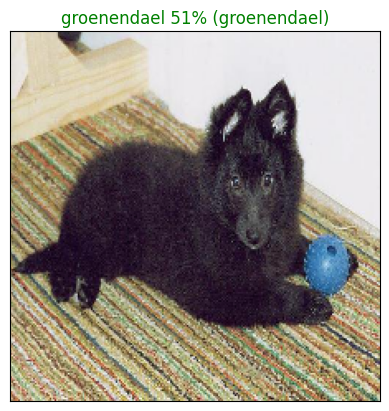

In [51]:
# View an example prediction, original image and truth label
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=77)

### make another funcation to view top 10 predictions

In [52]:
def plot_pred_conf(prediction_probabilities , labels , n=1):
  pred_prob,true_label = prediction_probabilities[n] , labels[n]

  pred_label =get_pred_label(pred_prob)

  top_10_pred_indx = pred_prob.argsort()[-10:][::-1]

  top_10_pred_values = pred_prob[top_10_pred_indx]

  top_10_pred_labels= unique_breeds[top_10_pred_indx]

  # plot

  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")


  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

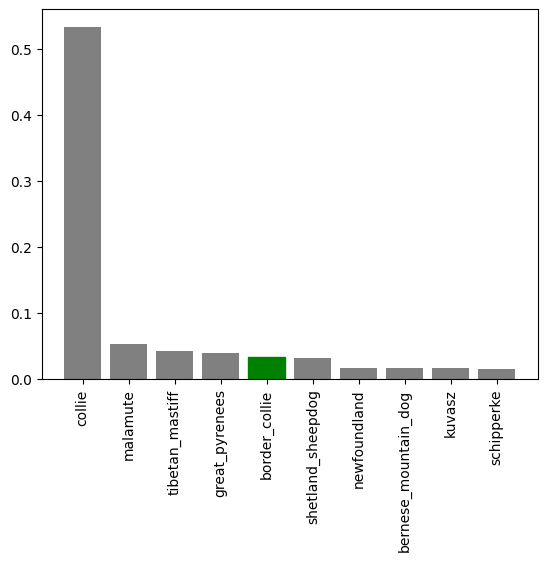

In [53]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

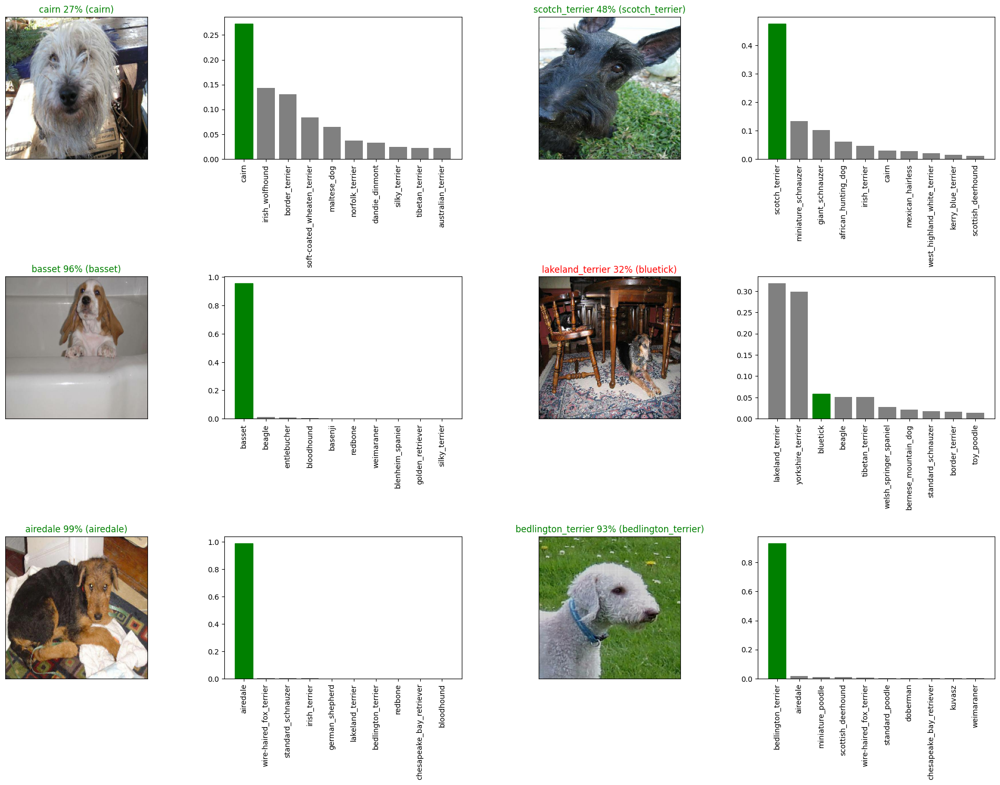

In [54]:
# Let's check a few predictions and their different values
i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(5*2*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                labels=val_labels,
                n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

## Saving and reloading trained model

In [58]:
# create a func to save a model

def save_model(models , suffix=None):
  """
  Saves a given model in a models directory and appends a suffix(string)
  """

  modeldir= os.path.join("drive/My Drive/Dog Vision/models",
                         datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))

  model_path=modeldir + "-" + suffix + ".h5" # save format model , h5 is extension

  print(f"saving model to :{model_path}...")
  model.save(model_path)

  return model_path

In [59]:
# create a func to load a trained model

def load_model(model_path):

  print(f"loading saved model from :{ model_path}")
  model=tf.keras.models.load_model(model_path,
                                   custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [60]:
# save our model trained on 1000 images

save_model(model , suffix="1000-images-mobilenetv2-Adam")

saving model to :drive/My Drive/Dog Vision/models/20240208-22181707430720-1000-images-mobilenetv2-Adam.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/My Drive/Dog Vision/models/20240208-22181707430720-1000-images-mobilenetv2-Adam.h5'

In [65]:
# Load our model trained on 1000 images
model_1000_images = load_model('drive/MyDrive/Dog Vision/models/20240208-22181707430720-1000-images-mobilenetv2-Adam.h5')

loading saved model from :drive/MyDrive/Dog Vision/models/20240208-22181707430720-1000-images-mobilenetv2-Adam.h5


In [66]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 7s 989ms/step - loss: 1.3073 - accuracy: 0.6650


[1.307345986366272, 0.6650000214576721]

In [67]:
# Evaluate the loaded model
model_1000_images.evaluate(val_data)

7/7 [==============================] - 7s 962ms/step - loss: 1.3073 - accuracy: 0.6650


[1.307345986366272, 0.6650000214576721]

### Training a model (on the full data)

In [68]:
# Turn full training data in a data batch
full_data = create_data_batches(X, y)

Creating training data batches.....


In [69]:
# Instantiate a new model for training on the full dataset
full_model = create_model()

Building model with : https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [70]:
# Create full model callbacks

# TensorBoard callback
full_model_tensorboard = create_tensorboard_callback()

# Early stopping callback
# Note: No validation set when training on all the data, therefore can't monitor validation accruacy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

In [72]:
%tensorboard --logdir drive/MyDrive/Dog \Vision/logs

ERROR: Failed to launch TensorBoard (exited with 2).
Contents of stderr:
2024-02-08 22:22:13.123019: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-02-08 22:22:13.123090: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-02-08 22:22:13.124001: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-02-08 22:22:14.380051: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
usage: tensorboard [-h] [--helpfull] [--logdir PATH] [--logdir_spec PATH_SPEC] [--host ADDR]
                   [--bind_all] [--port PORT] [--reuse_port BOOL] [--load_f

In [73]:
# Fit the full model to the full training data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard,
                          full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 394s 1s/step - loss: 1.3159 - accuracy: 0.6740
Epoch 2/100
320/320 [==============================] - 356s 1s/step - loss: 0.3966 - accuracy: 0.8838
Epoch 3/100
320/320 [==============================] - 339s 1s/step - loss: 0.2352 - accuracy: 0.9362
Epoch 4/100
320/320 [==============================] - 343s 1s/step - loss: 0.1542 - accuracy: 0.9621
Epoch 5/100
320/320 [==============================] - 346s 1s/step - loss: 0.1069 - accuracy: 0.9787
Epoch 6/100
320/320 [==============================] - 346s 1s/step - loss: 0.0761 - accuracy: 0.9876
Epoch 7/100
320/320 [==============================] - 342s 1s/step - loss: 0.0591 - accuracy: 0.9914
Epoch 8/100
320/320 [==============================] - 345s 1s/step - loss: 0.0455 - accuracy: 0.9943
Epoch 9/100
320/320 [==============================] - 348s 1s/step - loss: 0.0371 - accuracy: 0.9960
Epoch 10/100
320/320 [==============================] - 345s 1s/step - loss: 0.031

### Saving and reloading the full model

In [74]:
# Save model to file
save_model(full_model, suffix="all-images-Adam")

saving model to :drive/My Drive/Dog Vision/models/20240209-00281707438515-all-images-Adam.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/My Drive/Dog Vision/models/20240209-00281707438515-all-images-Adam.h5'

In [75]:
# Load in the full model
loaded_full_model = load_model('drive/MyDrive/Dog Vision/models/20240208-22181707430720-1000-images-mobilenetv2-Adam.h5')

loading saved model from :drive/MyDrive/Dog Vision/models/20240208-22181707430720-1000-images-mobilenetv2-Adam.h5


### Making predictions on the test dataset
 To make predictions on the test data, we'll:

* Get the test image filenames.

* Convert the filenames into test data batches using create_data_batches() and setting the test_data parameter to True (since there are no labels with the test images).

* Make a predictions array by passing the test data batches to the predict() function.

In [76]:
# Load test image filenames
test_path = "drive/MyDrive/Dog Vision/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]

test_filenames[:10]

['drive/MyDrive/Dog Vision/test/dfc41d3f135d49a41e7b796883ff030e.jpg',
 'drive/MyDrive/Dog Vision/test/e50319e7efc447bb684fbfdbed3ff041.jpg',
 'drive/MyDrive/Dog Vision/test/ddf48fc0d3f0719c40332708c331a9ab.jpg',
 'drive/MyDrive/Dog Vision/test/e42e9ceb31ec428968e88b556a92e858.jpg',
 'drive/MyDrive/Dog Vision/test/e2ef94a22af1d5375132de4eb19d2a64.jpg',
 'drive/MyDrive/Dog Vision/test/e291c3955198350ab26495e9290dbe34.jpg',
 'drive/MyDrive/Dog Vision/test/dcab2d03a686ab3f31d1bc3e5700f6d1.jpg',
 'drive/MyDrive/Dog Vision/test/e6b1859592468c8ffc1a73f87b201ba7.jpg',
 'drive/MyDrive/Dog Vision/test/dd3eb4338145e614d325a917a35e5a1e.jpg',
 'drive/MyDrive/Dog Vision/test/dd98d4023806fdee7721b42db812f131.jpg']

In [77]:
# How many test images are there?
len(test_filenames)

10357

In [78]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [79]:
# Make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

324/324 [==============================] - 577s 2s/step


In [80]:
# Check out the test predictions
test_predictions[:10]

array([[3.1866126e-05, 3.5274671e-03, 9.3079623e-05, ..., 1.0691179e-04,
        1.1282298e-04, 1.4287529e-05],
       [7.3639982e-05, 2.3146538e-04, 1.7132083e-04, ..., 5.4237212e-04,
        1.4897123e-03, 1.9874246e-04],
       [3.5600289e-04, 2.9255691e-04, 9.2547161e-05, ..., 1.4219907e-05,
        6.2017956e-05, 1.0005794e-03],
       ...,
       [2.3919387e-05, 1.4637248e-04, 4.3410339e-05, ..., 1.1684370e-03,
        1.2166644e-02, 1.1047932e-03],
       [1.4142663e-04, 4.1049093e-06, 1.8330273e-03, ..., 1.4643507e-03,
        4.7473298e-04, 2.2429354e-03],
       [5.4066368e-05, 1.9817492e-04, 4.2179112e-05, ..., 1.7126218e-03,
        2.6747151e-04, 4.1228093e-05]], dtype=float32)

### Preparing test dataset predictions for Kaggle
Looking at the Kaggle sample submission, it looks like they want the models output probabilities each for label along with the image ID's.

To get the data in this format, we'll:

* Create a pandas DataFrame with an ID column as well as a column for each dog breed.

* Add data to the ID column by extracting the test image ID's from their filepaths.
* Add data (the prediction probabilities) to each of the dog breed columns using the unique_breeds list and the test_predictions list.

* Export the DataFrame as a CSV to submit it to Kaggle.

In [81]:
# Create pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [82]:
test_path = "drive/MyDrive/Dog Vision/test/"
preds_df["id"] = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,dfc41d3f135d49a41e7b796883ff030e,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e50319e7efc447bb684fbfdbed3ff041,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,ddf48fc0d3f0719c40332708c331a9ab,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e42e9ceb31ec428968e88b556a92e858,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e2ef94a22af1d5375132de4eb19d2a64,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [83]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,dfc41d3f135d49a41e7b796883ff030e,0.000032,0.003527,0.000093,0.000031,0.000049,0.000004,0.000016,0.000045,0.000042,...,0.002232,0.000065,0.000005,0.000270,0.000029,0.000011,0.001672,0.000107,0.000113,0.000014
1,e50319e7efc447bb684fbfdbed3ff041,0.000074,0.000231,0.000171,0.000825,0.003063,0.125882,0.000074,0.003987,0.000493,...,0.000055,0.000302,0.000340,0.000136,0.000437,0.000517,0.000060,0.000542,0.001490,0.000199
2,ddf48fc0d3f0719c40332708c331a9ab,0.000356,0.000293,0.000093,0.000329,0.000590,0.000034,0.001445,0.000735,0.005965,...,0.001893,0.000028,0.000016,0.000248,0.000063,0.000171,0.008272,0.000014,0.000062,0.001001
3,e42e9ceb31ec428968e88b556a92e858,0.002724,0.000311,0.000033,0.000023,0.001019,0.000931,0.000235,0.006795,0.000021,...,0.003044,0.000069,0.000567,0.002985,0.021479,0.000007,0.000325,0.000922,0.000013,0.000139
4,e2ef94a22af1d5375132de4eb19d2a64,0.000499,0.000115,0.000448,0.000374,0.001540,0.000975,0.000108,0.021977,0.114506,...,0.000274,0.001379,0.002641,0.023571,0.009313,0.002277,0.000715,0.001479,0.020174,0.000397


In [84]:
preds_df.to_csv("drive/MyDrive/Dog Vision/full_submission_1_mobilienetV2_adam.csv",
                 index=False)

### Making predictions on custom images


In [86]:
# Get custom image filepaths
custom_path = "drive/MyDrive/Dog Vision/images/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [87]:

# Turn custom image into batch (set to test data because there are no labels)
custom_data = create_data_batches(custom_image_paths, test_data=True)

Creating test data batches...


In [88]:

# Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)

1/1 [==============================] - 0s 380ms/step


In [89]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['basenji', 'golden_retriever', 'labrador_retriever']

In [90]:

# Get custom images (our unbatchify() function won't work since there aren't labels)
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

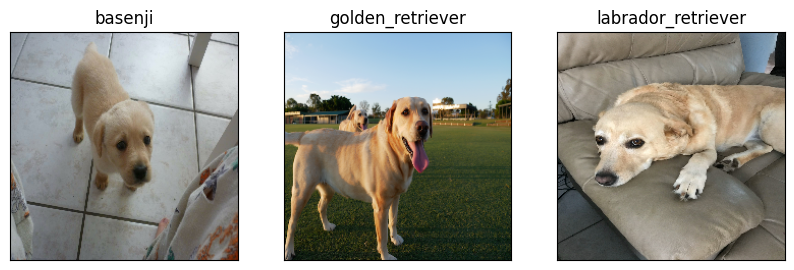

In [91]:

# Check custom image predictions
plt.figure(figsize=(10, 10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)